---
title       : "Example: Rust & Rothwell (19"
subtitle    : 
author      : Paul Schrimpf
date        : `j using Dates; print(Dates.today())`
bibliography: "rr.bib"
---

<a rel="license"
href="http://creativecommons.org/licenses/by-sa/4.0/"><img alt="Creative
Commons License" style="border-width:0"
src="https://i.creativecommons.org/l/by-sa/4.0/88x31.png"
/></a><br />This work is licensed under a <a rel="license"
href="http://creativecommons.org/licenses/by-sa/4.0/">Creative
Commons Attribution-ShareAlike 4.0 International License</a>.

### About this document {-}

This document was created using Weave.jl. The code is available in
[the course github
repository](https://github.com/ubcecon/ECON628_2018/paul). The same
document generates both static webpages and associated jupyter
notebooks.

$$
\def\indep{\perp\!\!\!\perp}
\def\Er{\mathrm{E}}
\def\R{\mathbb{R}}
\def\En{{\mathbb{E}_n}}
\def\Pr{\mathrm{P}}
\newcommand{\norm}[1]{\left\Vert {#1} \right\Vert}
\newcommand{\abs}[1]{\left\vert {#1} \right\vert}
\DeclareMathOperator*{\argmax}{arg\,max}
\DeclareMathOperator*{\argmin}{arg\,min}
\def\inprob{\,{\buildrel p \over \rightarrow}\,} 
\def\indist{\,{\buildrel d \over \rightarrow}\,} 
$$

# Introduction

These notes describe an attempt to reproduce the results of @rr1995
"Optimal response to a shift in regulatory regime: The case of the US
nuclear power industry." This paper estimates a dynamic discrete
choice model of nuclear power plant operation. The reasons for looking
at this example include:

- it incorporates dynamic programming and estimation, so it's related
  to many of the things we've covered
- data is readily available
- it is realistically complicated and messy

## Model

The model is a finite horizon dynamic program. States, $x$, and
actions, $a$ are discrete. The instantaneous payoff from action $a$ in
state $s$ is $u(x,a,\phi)$, where $\phi$ are parameters to be
estimated. Time is discrete. The discount factor is $\beta$. States
follow a controlled markov process with transition probabilities $p(x'|x,a)$
At time
$T = 480$ months, power plants are assumed to be forced to shutdown
permanently. Let $v_T(x,a) = 0$. The choice specific value function at
time $t$ is defined recursively as 
$$
v_t(x,a;p) = u(x,a,\phi) + \beta \int \Er[\max_{a' \in A(x')}
v_{t+1}(x',a';p) + \epsilon(a')] p(dx'|x,a)
$$
Assuming $\epsilon(a) \sim$ type-I extreme value, 
$$
\Er[\max_{a' \in A(x')} v_{t+1}(x',a';p) + \epsilon(a')] = \log \left(
\sum{a' \in A(x')} \exp(v_{t+1}(x',a';p)) \right) + \gamma
$$

## Estimation

The model is estimated by two-step maximum likelihood. In the first
step, $p(dx'|x,a)$ is estimated separately. In the second step the and
observed choices are used to estimate $\phi$. 
Let
$\{t_i,x_i,a_i\}_{i=1}^N$ denote the observed, times, states, and
actions. Then the likelihood is 
$$
\mathcal{L}(\phi,p) = \frac{1}{N} \sum_i \log\left(
    \frac{\exp(v_{t_i}(x_i,a_i;p))}{\sum_{a \in A(x_i)}
    \exp(v_{t_i}(x_i,a;p))} \right)
$$


### Aside: use modules

For any project of length, it's worthwhile to define your functions in
a module, and use Revise.jl to auto-reload your functions every time
you save changes. Defining functions in a separate module ensures that
they don't share scope with your main repl. For example, if you just
enter the following in the repl,

In [1]:
x=1.0
function f(z)
  x^2
end

f (generic function with 1 method)

There will be no error, but it is likely not what you want. 
Functions defined in modules become arguably more convenient than
working directly in the REPL when you use Revise.jl. To use modules,

In [2]:
if (false) # to make this not evaluate in notebooks ...

# Contents of MyModule.jl
# module MyModule # breaks notebook()

# export f, g 

function g(x)
  sin(x)
end

function f(z)
  z/g(z)
end

# end

end

In the REPL or a file you include() directly,

In [3]:
if (false) # to make this not evaluate in notebooks ...
using Revise
push!( LOAD_PATH, "./" )
using MyModule

g(1.0)
f(2)
end

A great benefit is that everytime you edit and save MyModule.jl, the
new version of `f` and `g` will be loaded into the REPL
automatically. 

# Data

In [4]:
using Revise
using GLM, DataFrames, DataFramesMeta, Plots, StatPlots, Statistics
push!( LOAD_PATH, "./" )
using DynamicDecision
using RustRothwell
plantData=load_rust_rothwell_data()
describe(plantData)

,variable,mean,min,median,max,nunique,nmissing,eltype
,Symbol,Union…,Any,Union…,Any,Union…,Union…,DataType
1,name,,ARKA1,,ZION2,117,,String
2,ID,307.076,10,304.0,530,,,Int64
3,steamSystem,,BabcockWilcox,,Other2,6,,CategoricalString{UInt32}
4,year,86.0398,75,87.0,94,,,Int64
5,month,6.54307,1,7.0,12,,,Int64
6,vintage,,preTMI,,postTMI,2,,CategoricalString{UInt32}
7,age,120.709,1,108.0,416,,,Int64
8,hrsRefuel,108.916,0.0,0.0,763.6,,,Float64
9,hrsPlanOut,33.1886,0.0,0.0,758.0,,,Float64


In [5]:
@df plantData corrplot([:age  :hrsOperating],
                       label=["Age", "Monthly hours operating"])

In [6]:
@df plantData corrplot([:age  :hrsRefuel],
                       label=["Age", "Monthly hours refueling"])

In [7]:
@df plantData corrplot([:age  :hrsForcedOut],
                       label=["Age", "Monthly hours forced outage"])

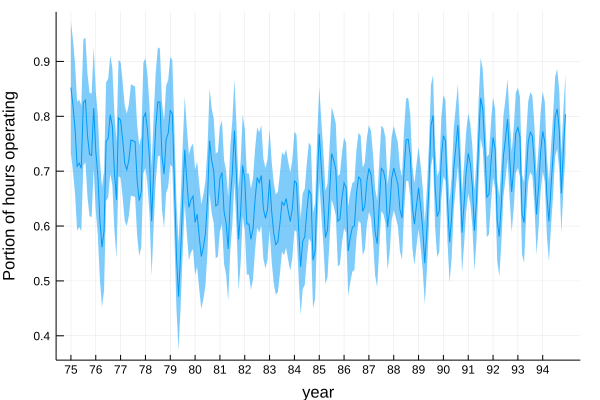

In [8]:
plantData[:pOperating] =
  plantData[:hrsOperating]./plantData[:hrsTotal]
plantData[:pRefuel] =
  plantData[:hrsRefuel]./plantData[:hrsTotal]
plantData[:pOut] =
  plantData[:hrsForcedOut]./plantData[:hrsTotal]
function plotaverageovertime(var::Symbol; ylabel="")
  tmp = plantData[[:t; :year; :month; var]]
  tmp[:Year] = tmp[:year] + (tmp[:month].-1)./12
  categorical!(tmp, :t)
  fmla = @eval @formula($var ~ t)
  avglm = lm(fmla, tmp)
  avg = unique(tmp[[:t; :Year]])
  # :confint seems to require an X matrix instead of a dataframe 
  newTerms = StatsModels.dropresponse!(avglm.mf.terms)
  mf = ModelFrame(newTerms, avg; contrasts = avglm.mf.contrasts)
  newX = ModelMatrix(mf).m  
  pred = predict(avglm, newX, :confint)
  avg[var] = pred[:,1]
  avg[:cir] = pred[:,3].-pred[:,1]
  plot(avg[:Year], avg[var], ribbon=avg[:cir],
       legend=:none, xlabel="year", ylabel=ylabel,
       xticks=minimum(tmp[:year]):maximum(tmp[:year]))
end
plotaverageovertime(:pOperating,ylabel="Portion of hours operating")

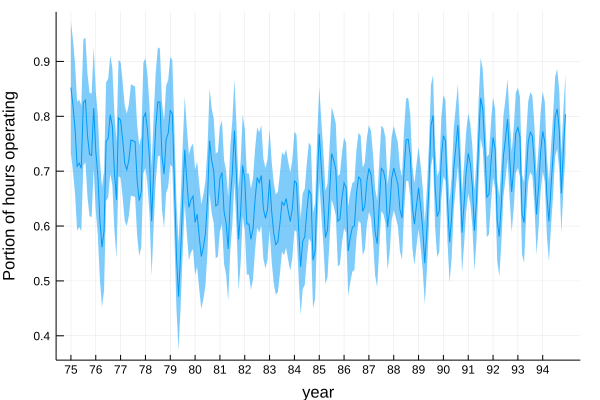

In [9]:
plotaverageovertime(:pOperating,ylabel="Portion of hours operating")

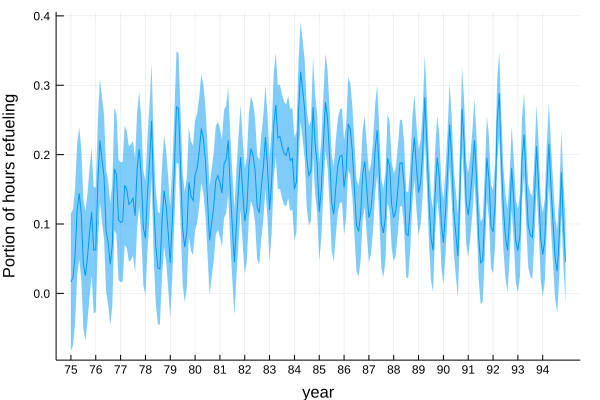

In [10]:
plotaverageovertime(:pRefuel,ylabel="Portion of hours refueling")

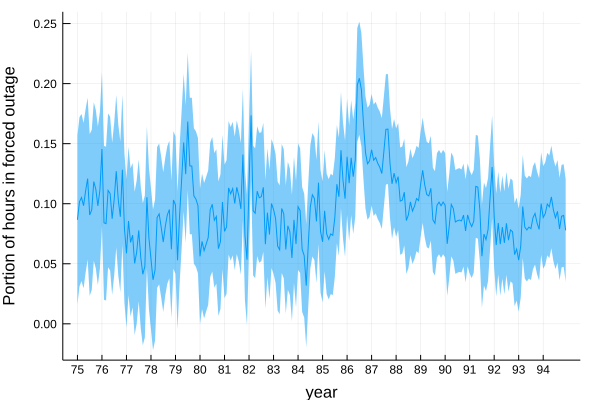

In [11]:
plotaverageovertime(:pOut,ylabel="Portion of hours in forced outage")

# Estimate transition probabilities

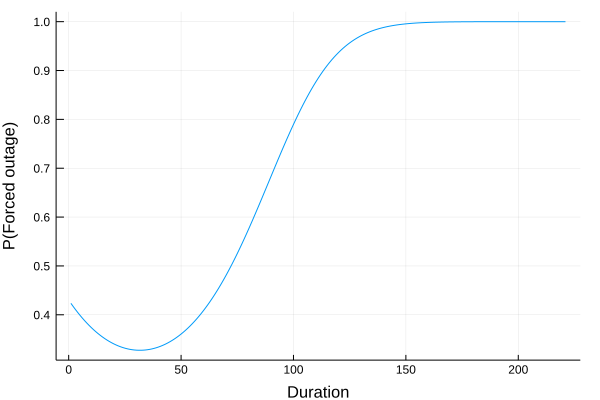

In [12]:
missing_to_false = x -> ifelse(ismissing(x), false, x)
plantData[:forcedOut] = plantData[:nppSignal].=="forcedOut"

function pof_transform!(df)
  df[:duration2] = df[:duration].^2
  return(df)
end
pof_transform!(plantData)
pof = glm( @formula(forcedOut ~ duration + duration2),
           @linq where(plantData,missing_to_false.((:nppSignal .!= "contRefuel") .&
                                                   .!(:majorProblemSpell) .&
                                                   (:spelltype.=="operating")))
           , Binomial(), LogitLink())
maxd = maximum(@linq where(plantData, missing_to_false.((:nppSignal
                                                         .!="contRefuel")))[:duration])
tmp = DataFrame(duration=1:maxd)
pof_transform!(tmp)
tmp.pForcedOutage = predict(pof, tmp)
# TODO: add confidence bands. predict for GLM with confint only works
# for linear regressions at the moment. There is an unresolved issue
# on the git page about extending it.

Plots.gr()
@df tmp plot(:duration, :pForcedOutage,
             xlabel="Duration",
             ylabel="P(Forced outage)",
             legend=false)

...

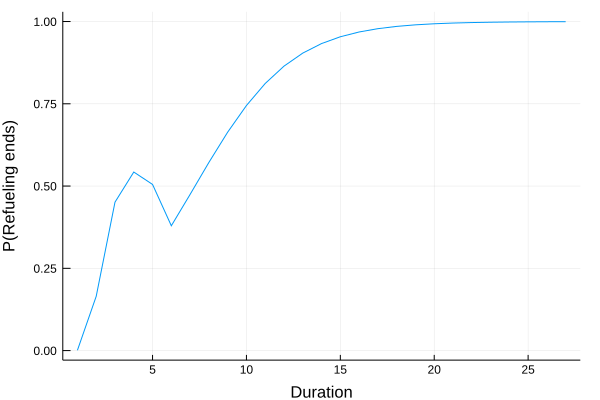

In [13]:
# estimate P(refueling ends | duration)
plantData[:refuelEnd] = (plantData[:nppSignal] .!= "contRefuel")
function pro_transform!(df)
  # we will need to transform X variables
  # whenever we calculate predicted probabilities
  df[:dcat] = categorical(min.(df[:duration],6))
  df[:dlong] = (d->(ifelse(d>=7, d-6, 0))).(df[:duration])
end
pro_transform!(plantData)
pro = glm( @formula(refuelEnd ~ dcat + dlong),
           @linq where(plantData,missing_to_false.(.!(:majorProblemSpell) .&
                                                   (:spelltype.=="refueling")))
           , Binomial(), LogitLink())
maxd = maximum(@linq where(plantData,
                           missing_to_false.(.!(:majorProblemSpell) .&
                                             (:spelltype.=="refueling")))[:duration])
tmp = DataFrame(duration=1:maxd)
pro_transform!(tmp)
tmp[:dcat] = categorical(min.(tmp[:duration],6))
tmp[:dlong] = (d->(ifelse(d>=7, d-6, 0))).(tmp[:duration])
tmp.pRefuelEnd = predict(pro, tmp)
Plots.gr()
@df tmp plot(:duration, :pRefuelEnd,
             xlabel="Duration",
             ylabel="P(Refueling ends)",
             legend=false)

## Combine into transition probabilities

In [14]:
maxduration = 36
plantData[:durationOrig] = plantData[:duration]
plantData[:duration] = min.(plantData[:duration],maxduration)
statefn = vector_index_converter(plantData,[:spelltype, :nppSignal,
                                            :duration])
actionfn = vector_index_converter(plantData,[:action])
function actionfn.index(a::String)
  actionfn.index(DataFrame([[a]],[:action]))
end

presume = (s)->probfn(s, pro, pro_transform!)
poutage = (s)->probfn(s, pof, pof_transform!)

P = transition_prob(poutage, presume, statefn, actionfn, maxduration)

8-element Array{SparseArrays.SparseMatrixCSC{Float64,Int64},1}:
 
  [10 ,   1]  =  0.576564
  [13 ,   1]  =  0.423436
  [1  ,   2]  =  0.576564
  [4  ,   2]  =  0.423436
  [10 ,   4]  =  0.576564
  [13 ,   4]  =  0.423436
  [1  ,   5]  =  0.576564
  [4  ,   5]  =  0.423436
  [19 ,  10]  =  0.582996
  [22 ,  10]  =  0.417004
  [1  ,  11]  =  0.582996
  [4  ,  11]  =  0.417004
  [19 ,  13]  =  0.582996
  [22 ,  13]  =  0.417004
  [1  ,  14]  =  0.582996
  [4  ,  14]  =  0.417004
  [28 ,  19]  =  0.589188
  [31 ,  19]  =  0.410812
  [1  ,  20]  =  0.589188
  [4  ,  20]  =  0.410812
  [28 ,  22]  =  0.589188
  ⋮
  [4  , 299]  =  0.327884
  [307, 301]  =  0.672116
  [310, 301]  =  0.327884
  [1  , 302]  =  0.672116
  [4  , 302]  =  0.327884
  [316, 307]  =  0.671569
  [319, 307]  =  0.328431
  [1  , 308]  =  0.671569
  [4  , 308]  =  0.328431
  [316, 310]  =  0.671569
  [319, 310]  =  0.328431
  [1  , 311]  =  0.671569
  [4  , 311]  =  0.328431
  [316, 316]  =  0.670829
  [319, 316]  =  0.3

# Estimate payoff parameters

In [15]:
# parameter estimates from Rust & Rothwell (1995)
ϕnames = Array{String, 1}(undef, actionfn.n+4)
ϕnames[actionfn.index("exit")] = "exit"
ϕnames[actionfn.index("refuel")] = "refuel"
ϕnames[actionfn.n+2] = "f.r"
ϕnames[actionfn.n+1] = "duration"
ϕnames[actionfn.index("shutdown")] = "shutdown"
ϕnames[actionfn.index("run25")] = "run25"
ϕnames[actionfn.index("run50")] = "run50"
ϕnames[actionfn.index("run75")] = "run75"
ϕnames[actionfn.index("run99")] = "run99"
ϕnames[actionfn.index("run100")] = "run100"
ϕnames[actionfn.n+3] = "f.s"
ϕnames[actionfn.n+4] = "f.100"

ϕpre_rr=zeros(actionfn.n+4)
ϕpre_rr[actionfn.index("exit")] = 0.0
ϕpre_rr[actionfn.index("refuel")] = -1.82
ϕpre_rr[actionfn.n+2] = -2.33
ϕpre_rr[actionfn.n+1] = -0.05
ϕpre_rr[actionfn.index("shutdown")] = -0.04
ϕpre_rr[actionfn.index("run25")] = -1.82
ϕpre_rr[actionfn.index("run50")] = -0.96
ϕpre_rr[actionfn.index("run75")] = -0.15
ϕpre_rr[actionfn.index("run99")] = 1.52
ϕpre_rr[actionfn.index("run100")] = 2.93
ϕpre_rr[actionfn.n+3] = -4.03
ϕpre_rr[actionfn.n+4] = -3.44


ϕpost_rr=zeros(actionfn.n+4)
ϕpost_rr[actionfn.index("exit")] = 0.0
ϕpost_rr[actionfn.index("refuel")] = -3.44
ϕpost_rr[actionfn.n+2] = -3.09
ϕpost_rr[actionfn.n+1] = -0.06
ϕpost_rr[actionfn.index("shutdown")] = -0.54
ϕpost_rr[actionfn.index("run25")] = -2.12
ϕpost_rr[actionfn.index("run50")] = -1.58
ϕpost_rr[actionfn.index("run75")] = -0.75
ϕpost_rr[actionfn.index("run99")] = 0.54
ϕpost_rr[actionfn.index("run100")] = 2.93
ϕpost_rr[actionfn.n+3] = -4.04
ϕpost_rr[actionfn.n+4] = -5.89

# setup
feasible = feasible_actions(statefn, actionfn)
T = 480
discount = 0.999
plantData[:stateIndex] = statefn.index(plantData)
plantData[:actionIndex] = actionfn.index(plantData)
preTMI = @linq where(plantData, :year .< 79 .| (:year.==79 .& :month.<=3))
postTMI= @linq where(plantData, :year.>80 .| (:year.==79 .& :month.>3))

# wrappers for estimation
function loglikei(ϕ,P;missingval=missing, data=plantData)
  loglikei_u(payoffs(ϕ, statefn, actionfn),
             data, :age, :stateIndex, :actionIndex,
             choicevalue, discount, T, P, feasible,
             missingval=missingval)
end
function loglikerr(ϕ,P;missingval=missing, data=plantData)
  mean(skipmissing(loglikei(ϕ,P,missingval=missingval, data=data)))
end

ll = loglikei(ϕpre_rr, P)
loglikerr(ϕpre_rr, P)

using JuMP, ForwardDiff,Ipopt, NLopt
d = length(ϕpre_rr)
function estimateRR(data=plantData) 
  m = Model(solver=NLoptSolver(algorithm=:LD_LBFGS))
  loglike_jump(ϕ...) = loglikerr(collect(ϕ),P, data=data)
  JuMP.register(m,:loglike, d,
                loglike_jump,
                autodiff=true)
  @variable(m, ϕ[1:d])
  for i in 1:d
    if (ϕnames[i]!="exit")
      setvalue(ϕ[i], ϕpost_rr[i])
    end
  end
  JuMP.fix(ϕ[findfirst(ϕnames.=="exit")],0.0)
  JuMP.setNLobjective(m, :Max, Expr(:call, :loglike, [ϕ[i] for i=1:d]...))
  optout=solve(m)
  return(ϕhat=getvalue(ϕ), opt=optout)
end

estimateRR (generic function with 2 methods)

In [16]:
using JLD2
if (false)
  est = estimateRR(preTMI)
  ϕpre = est.ϕhat
  est = estimateRR(postTMI)
  ϕpost= est.ϕhat
  @save "rrest.jld2"  ϕpre ϕpost
else # load saved estimated
  @load "rrest.jld2"
end

DataFrame([ϕnames ϕpre ϕpre_rr  ϕpost ϕpost_rr],
          [:name; :pre; :pre_rr; :post; :post_rr])

,name,pre,pre_rr,post,post_rr
,Any,Any,Any,Any,Any
1,run100,0.361111,2.93,1.15319,2.93
2,run75,-2.55338,-0.15,-2.98619,-0.75
3,run99,-1.10771,1.52,-1.70619,0.54
4,refuel,-0.959587,-1.82,-1.50713,-3.44
5,run25,-4.17298,-1.82,-4.19983,-2.12
6,run50,-3.53488,-0.96,-3.74479,-1.58
7,exit,0.0,0.0,0.0,0.0
8,shutdown,-2.69323,-0.04,-2.35202,-0.54
9,duration,-0.0264501,-0.05,-0.0391322,-0.06


## Computing the variance

In [17]:
function variance(ϕhat; data=plantData) 
  H = ForwardDiff.hessian(ϕ->loglikerr(ϕ,P, missingval=0.0, data=data), ϕhat)
  gradi=ForwardDiff.jacobian(ϕ->loglikei(ϕ,P, missingval=0.0,data=data),ϕhat)
  Σ = cov(gradi)
  e = findall(ϕnames.!="exit")
  li = loglikei(ϕhat,P, data=data)
  missportion=mean(ismissing.(li))
  Vϕ = zeros(length(ϕhat),length(ϕhat))
  n = sum(.!ismissing.(li))
  Vϕ[e,e] = inv(H[e,e])*Σ[e,e]*inv(H[e,e])/(n*(1.0-missportion))
  Vϕ1 = deepcopy(Vϕ)
  
  ## The above formula ignores estimation error in P. We can should it in
  pcoefs = [coef(pof); coef(pro)]
  Vp = zeros(length(pcoefs),length(pcoefs))
  lo = length(coef(pof))
  lp = length(pcoefs)
  Vp[1:lo, 1:lo] = vcov(pof)
  Vp[(lo+1):lp,(lo+1):lp] = vcov(pro)
  
  function transprob(pcoefs)
    lo = length(coef(pof))
    poutfn = s->probfn(s, pof, pof_transform!,
                       coefs=pcoefs[1:lo])
    presfn = s->probfn(s, pro, pro_transform!,
                       coefs=pcoefs[(1+lo):length(pcoefs)])
    transition_prob(poutfn, presfn, statefn, actionfn, maxduration)
  end
  function loglike_ϕp(ϕ,pcoefs)
    loglikerr(ϕ,transprob(pcoefs), missingval=0.0,
              data=data)/(1-missportion)
  end 
  Dϕp = ForwardDiff.jacobian(p->ForwardDiff.gradient(ϕ->loglike_ϕp(ϕ,p),ϕhat),                           pcoefs)
  
  Vϕ = zeros(length(ϕhat),length(ϕhat))
  Vϕ[e,e] = inv(H[e,e])*(Σ[e,e] + Dϕp[e,:]*Vp*Dϕp[e,:]') *
    inv(H[e,e])/(n*(1.0-missportion))
  return(V=Vϕ, V1=Vϕ1, H=H, Σ=Σ, Dϕp=Dϕp, Vp=Vp)
end

if (false)
  vpre = variance(ϕpre, data=preTMI)
  vpost = variance(ϕpre, data=postTMI)
  @save "vrr.jld2" vpre vpost
else
  @load "vrr.jld2"
end

using LinearAlgebra
DataFrame([sqrt.(diag(vpost.V,0)) .- sqrt.(diag(vpost.V1,0))])

,x1
,Float64
1,1.89057e-6
2,9.68573e-7
3,1.69916e-6
4,8.22079e-7
5,3.74526e-7
6,5.62791e-7
7,0.0
8,7.34197e-8
9,1.73616e-7


In [18]:
DataFrame([ϕnames ϕpre sqrt.(diag(vpre.V,0)) ϕpost sqrt.(diag(vpost.V,0))],
          [:name; :preTMI; :se_pre; :postTMI; :se_post])

,name,preTMI,se_pre,postTMI,se_post
,Any,Any,Any,Any,Any
1,run100,0.361111,0.0537,1.15319,0.0182993
2,run75,-2.55338,0.0755551,-2.98619,0.0335127
3,run99,-1.10771,0.0499443,-1.70619,0.0191039
4,refuel,-0.959587,0.0721,-1.50713,0.020247
5,run25,-4.17298,0.155166,-4.19983,0.0866672
6,run50,-3.53488,0.115937,-3.74479,0.0576755
7,exit,0.0,0.0,0.0,0.0
8,shutdown,-2.69323,0.161943,-2.35202,0.0588689
9,duration,-0.0264501,0.00349471,-0.0391322,0.00170402


# Model fit

# Counterfactuals